# Week 3 Assignment - **k-means Clustering**


**Grad 509: Assignment for k-means clustering**

Make sure you can copy and run the code below, obtaining similar results to those presented here. You will need to download the image ladybug.jpg from Brightspace.
Once you have successfully run the code, please attempt to answer the questions at the bottom.

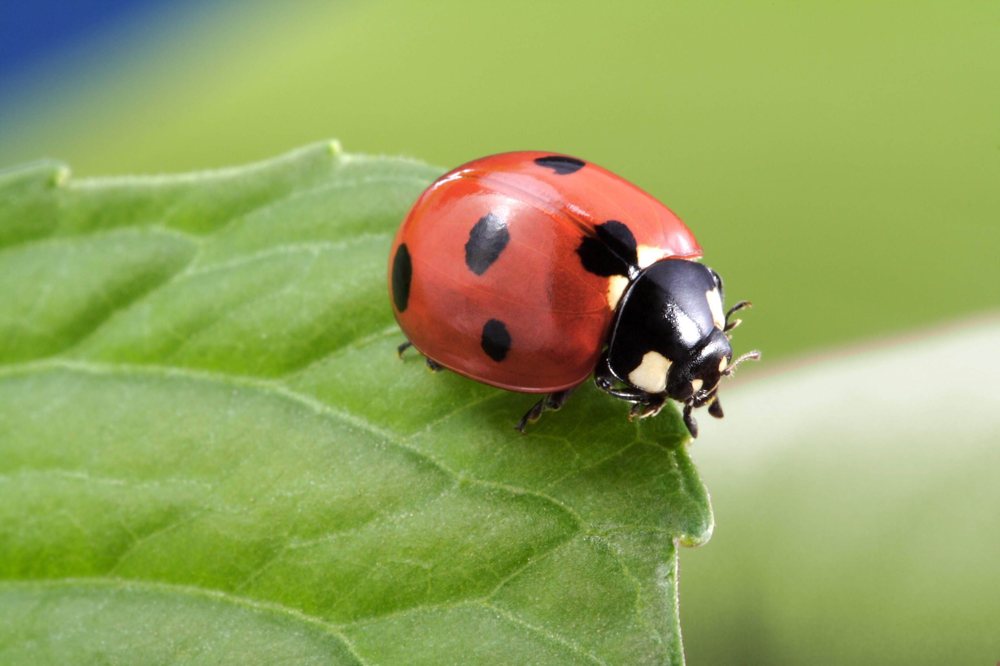

In [ ]:
# Read and display an image using Python Imaging Library (PIL)
import PIL
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

image = PIL.Image.open('ladybug.jpg')
display(image)

In [2]:
# Convert the image to an array
X = np.asarray(image)
#Downsample every 4th pixel
X = X[::4,::4,:]
print(X.shape)
shp = X.shape

(576, 864, 3)


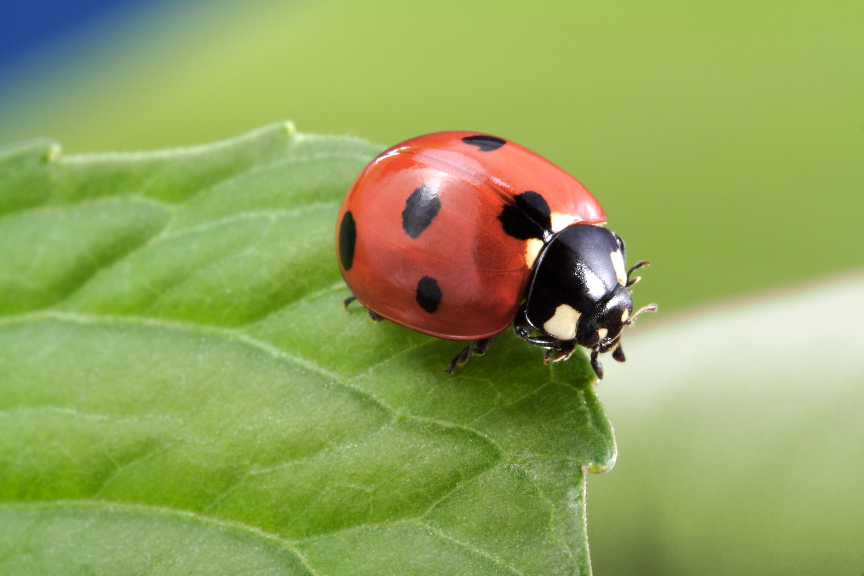

In [4]:
# Display the downscaled image
display(Image.fromarray(X.astype('uint8'), 'RGB'))

In [5]:
# Convert X to a long array of RGB values
X = X.reshape(-1, 3)
print(X.shape)

(497664, 3)


In [6]:
# Run k-means clustering

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=1).fit(X)
segmented_img = kmeans.cluster_centers_[kmeans.labels_]

In [9]:
kmeans.labels_

array([3, 3, 3, ..., 2, 2, 2], shape=(497664,), dtype=int32)

In [10]:
kmeans.cluster_centers_

array([[155.73845937, 182.40270965, 100.16184251],
       [206.49243912,  94.36991183,  74.62766686],
       [115.89334195, 148.80033244,  60.39842091],
       [ 59.8901044 ,  56.46827254,  38.92920819],
       [217.31786549, 217.91014612, 191.23052824]])

In [8]:
segmented_img

array([[ 59.8901044 ,  56.46827254,  38.92920819],
       [ 59.8901044 ,  56.46827254,  38.92920819],
       [ 59.8901044 ,  56.46827254,  38.92920819],
       ...,
       [115.89334195, 148.80033244,  60.39842091],
       [115.89334195, 148.80033244,  60.39842091],
       [115.89334195, 148.80033244,  60.39842091]], shape=(497664, 3))

In [11]:
# Convert image back to a grid of RGB values
img_t = segmented_img.reshape(shp)
# Convert from array back to image (the RGB values must be 8-bit integers)
img = Image.fromarray(img_t.astype('uint8'), 'RGB')

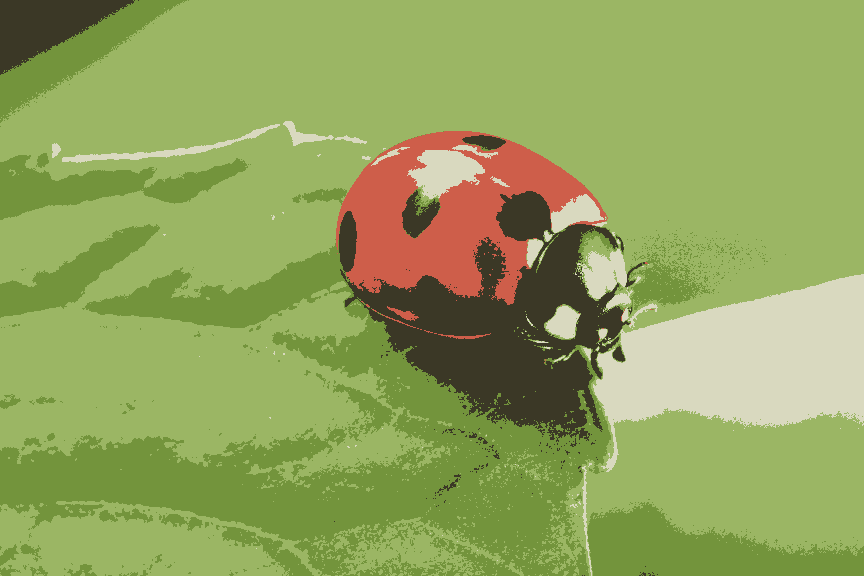

588422570.4916214

In [12]:
display(img) # Plot image
kmeans.inertia_ # Print k-means inertia score

In [13]:
inertia = np.zeros(20)
for ii in range(0,20):
    kmeans = KMeans(n_clusters=ii+1, random_state=1).fit(X)
    inertia[ii] = kmeans.inertia_

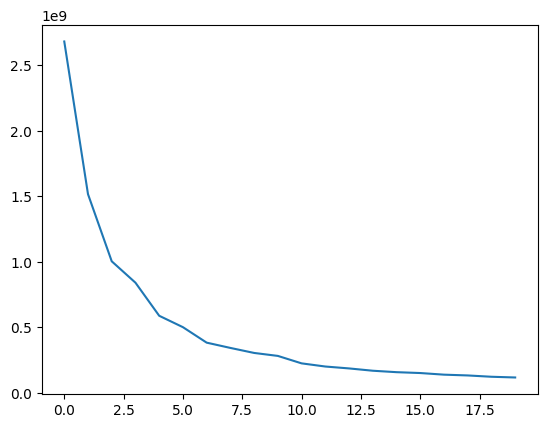

In [14]:
import matplotlib.pyplot as plt
plt.plot(inertia)

## Questions

1) Repeat the above analysis a number of times (e.g. 10) for the same value of k. For each run, calculate the inertia score. What is the mean and spread of these scores? Plot the segmented image for the best and worst inertia score
2) For a range of values of k, the k-means algorithm 10 times. For each value of k, what are the average, the minimum and maximum inertia score. Plot each of these against k, so that you get a "banded" or "ribbon" version of the plot above (https://stackoverflow.com/questions/61368805/how-to-plot-shaded-error-bands-with-seaborn).
3) Looking at this plot, what do you think a good number of clusters is? For that choice, plot the corresponding image segmentation.
4) The above analysis segments pixels of an image using RGB values. Can you suggest any additional features you can add to each pixel to possibly improve the segmentation? You need not implement this, though you are welcome to try!
5) Run a k-means clustering of an image of your choice. Display the results and comment on them.

## Answers

### Question 1

*1) Repeat the above analysis a number of times (e.g. 10) for the same value of k. For each run, calculate the inertia score. What is the mean and spread of these scores? Plot the segmented image for the best and worst inertia score*

To perform the analysis I will use a value of K equal to 6, since this seem to be the optimal value from the elbow analysis. And we will perform the analysis using 10 iterations.

In [18]:
inertia = np.zeros(10)

img_list = []

for ii in range(0,10):
    print(f'Iteration {ii+1}')
    kmeans = KMeans(n_clusters=6).fit(X)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    img_t = segmented_img.reshape(shp)
    img_x = Image.fromarray(img_t.astype('uint8'), 'RGB')
    inertia[ii] = kmeans.inertia_
    img_list.append(img_x)

Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10


In [25]:
print(f'From the 10 iterations we get the following values: \n - mean: {round(float(inertia.mean()),2)}, \n - std: {round(float(np.std(inertia, ddof=1)),2)}, \n - min: {round(float(np.min(inertia)),2)}, \n - max: {round(float(np.max(inertia)),2)}')

From the 10 iterations we get the following values: 
 - mean: 504795761.28, 
 - std: 32994875.96, 
 - min: 465068325.16, 
 - max: 551785683.93


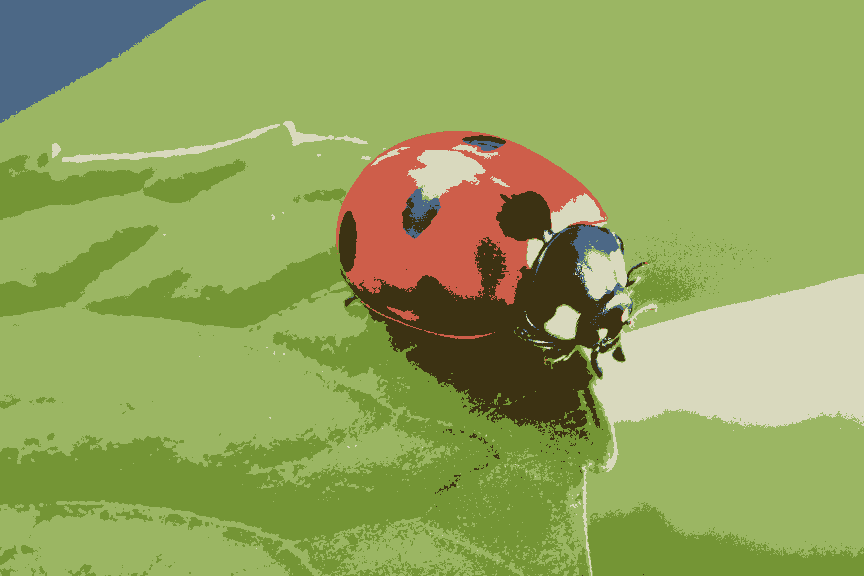

In [29]:
# best iteration:

index_of_min = np.argmin(inertia)
img_list[index_of_min]

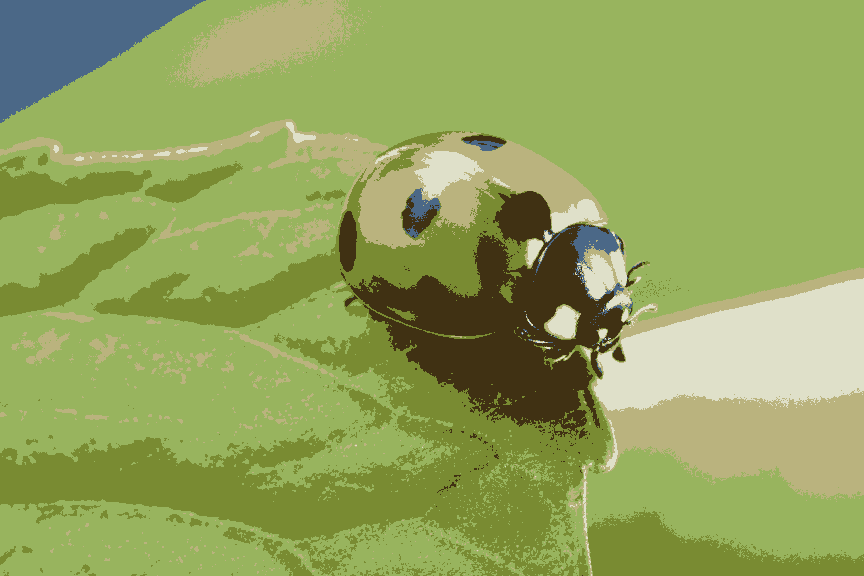

In [30]:
# worst iteration

index_of_max = np.argmax(inertia)
img_list[index_of_max]

### Question 2

2) For a range of values of k, the k-means algorithm 10 times. For each value of k, what are the average, the minimum and maximum inertia score. Plot each of these against k, so that you get a "banded" or "ribbon" version of the plot above (https://stackoverflow.com/questions/61368805/how-to-plot-shaded-error-bands-with-seaborn).

In [51]:
inertia_dict = {}
img_dict = {}

for i in range(0,20):

    inertia = np.zeros(10)
    img_list = []

    for ii in range(0,10):
        print(f'Number of k-means {i+1}, Iteration {ii+1}')
        kmeans = KMeans(n_clusters=i+1).fit(X)
        inertia[ii] = kmeans.inertia_
        segmented_img = kmeans.cluster_centers_[kmeans.labels_]
        img_t = segmented_img.reshape(shp)
        img_x = Image.fromarray(img_t.astype('uint8'), 'RGB')
        img_list.append(img_x)
    
    inertia_dict[f'{i+1}'] = [round(float(inertia.mean()),2),round(float(np.min(inertia)),2),round(float(np.max(inertia)),2)]
    img_dict[f'{i+1}'] = [img_list[np.argmin(inertia)],img_list[np.argmax(inertia)]]

Number of k-means 1, Iteration 1
Number of k-means 1, Iteration 2
Number of k-means 1, Iteration 3
Number of k-means 1, Iteration 4
Number of k-means 1, Iteration 5
Number of k-means 1, Iteration 6
Number of k-means 1, Iteration 7
Number of k-means 1, Iteration 8
Number of k-means 1, Iteration 9
Number of k-means 1, Iteration 10
Number of k-means 2, Iteration 1
Number of k-means 2, Iteration 2
Number of k-means 2, Iteration 3
Number of k-means 2, Iteration 4
Number of k-means 2, Iteration 5
Number of k-means 2, Iteration 6
Number of k-means 2, Iteration 7
Number of k-means 2, Iteration 8
Number of k-means 2, Iteration 9
Number of k-means 2, Iteration 10
Number of k-means 3, Iteration 1
Number of k-means 3, Iteration 2
Number of k-means 3, Iteration 3
Number of k-means 3, Iteration 4
Number of k-means 3, Iteration 5
Number of k-means 3, Iteration 6
Number of k-means 3, Iteration 7
Number of k-means 3, Iteration 8
Number of k-means 3, Iteration 9
Number of k-means 3, Iteration 10
Number 

In [52]:
inertia_dict

{'1': [2680595464.0, 2680595464.0, 2680595464.0],
 '2': [1515859425.91, 1515854948.96, 1515863996.22],
 '3': [1066539550.52, 1003849103.84, 1160687850.71],
 '4': [791797192.99, 754401539.2, 1041898105.27],
 '5': [607769905.73, 588403032.19, 638922608.31],
 '6': [503449279.57, 465076017.52, 549707906.68],
 '7': [419324674.59, 383381617.28, 499349578.56],
 '8': [357108868.13, 323127787.27, 422412585.07],
 '9': [291104299.18, 280462554.98, 304876651.08],
 '10': [253456788.54, 248255583.95, 259900555.59],
 '11': [225731083.15, 221289863.92, 233161660.92],
 '12': [208043496.09, 201253590.25, 216111296.79],
 '13': [187653400.06, 183675680.88, 194290699.4],
 '14': [173854182.25, 169166284.4, 179168878.0],
 '15': [161075292.59, 155491938.45, 169127694.35],
 '16': [148169534.06, 144528875.99, 152032739.15],
 '17': [138539786.24, 134773724.21, 143275059.67],
 '18': [130859116.0, 126951049.31, 136426379.3],
 '19': [122086766.94, 120394746.93, 125936844.46],
 '20': [116417540.19, 113724133.76, 119

In [53]:
mean = np.zeros(20)
mini = np.zeros(20)
maxi = np.zeros(20)

for key in inertia_dict.keys():
    ii = int(key) - 1
    mean[ii] = inertia_dict[key][0]
    mini[ii] = inertia_dict[key][1]
    maxi[ii] = inertia_dict[key][2]

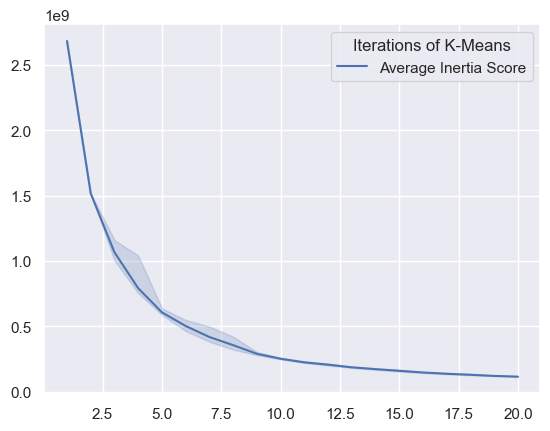

In [54]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set()

x = np.array([int(key) for key in inertia_dict.keys()])

plt.plot(x, mean, 'b-', label='Average Inertia Score')
plt.fill_between(x, mini, maxi, color='b', alpha=0.2)

plt.legend(title='Iterations of K-Means')
plt.show()

### Question 3

3) Looking at this plot, what do you think a good number of clusters is? For that choice, plot the corresponding image segmentation.

After lookting at the plot, we can see that the average value reduce the rate of reduction of inertia drastically after k = 6. But by complementing this with the spread, we see that this value of K has a lot of variation, and the value of K = 9, has a very low variation with a small level of inertia. In conclusion I think the optimal value would be 9, as it has a "relative" low value of inertia, small number of clusters and low variation of inertia.

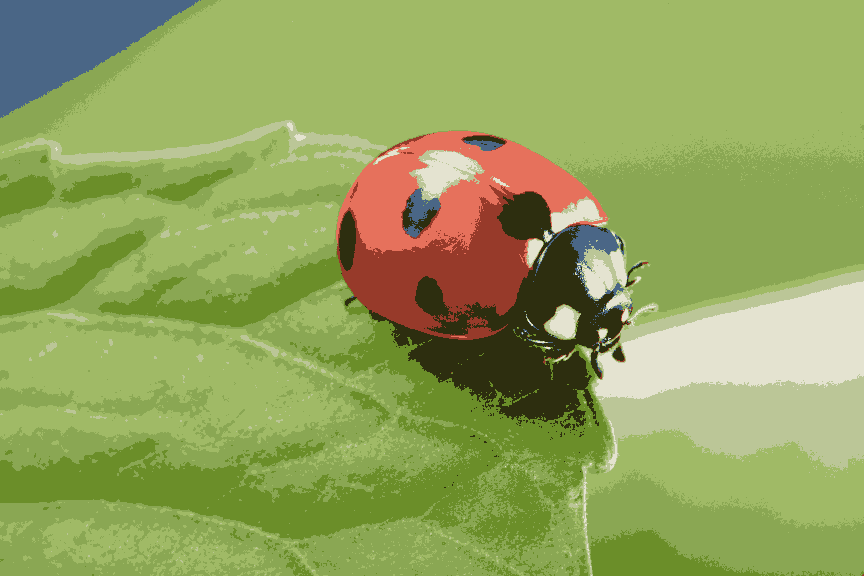

In [56]:
img_dict['9'][0]

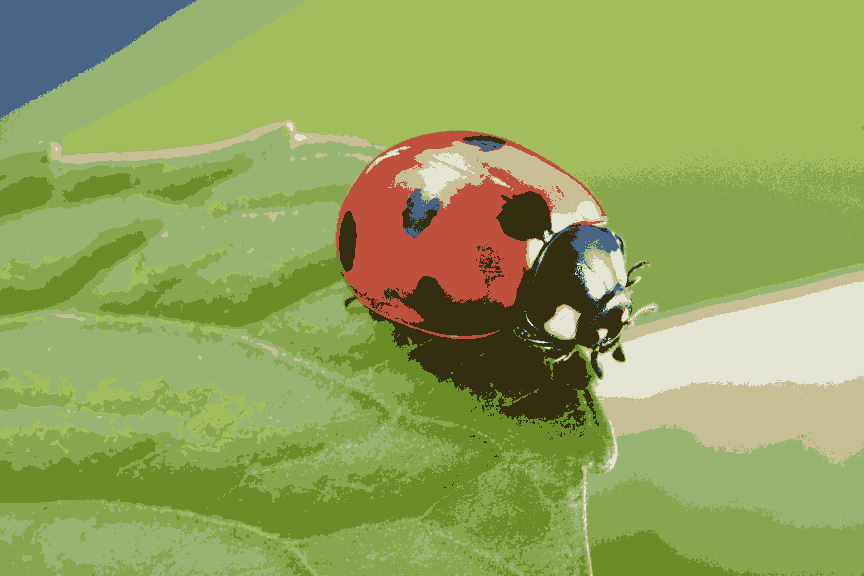

In [57]:
img_dict['9'][1]

### Question 4


4) The above analysis segments pixels of an image using RGB values. Can you suggest any additional features you can add to each pixel to possibly improve the segmentation? You need not implement this, though you are welcome to try!

First I think spatial position brings useful information (to keep regions coherent):

- Coordinates: normalized (x, y) so nearby pixels prefer same cluster.
- Positional encodings: low-freq Fourier features of (x, y) to capture smooth spatial trends.

Second, ilumination aware: 
- Normalized/ratio channels: R/G, R/B, G/B
- Intensity I=(R+G+B)/3.

Third, multi-scale features: repeat color/texture stats at multiple patch sizes (e.g., 5×5, 15×15).

### Question 5

5) Run a k-means clustering of an image of your choice. Display the results and comment on them.

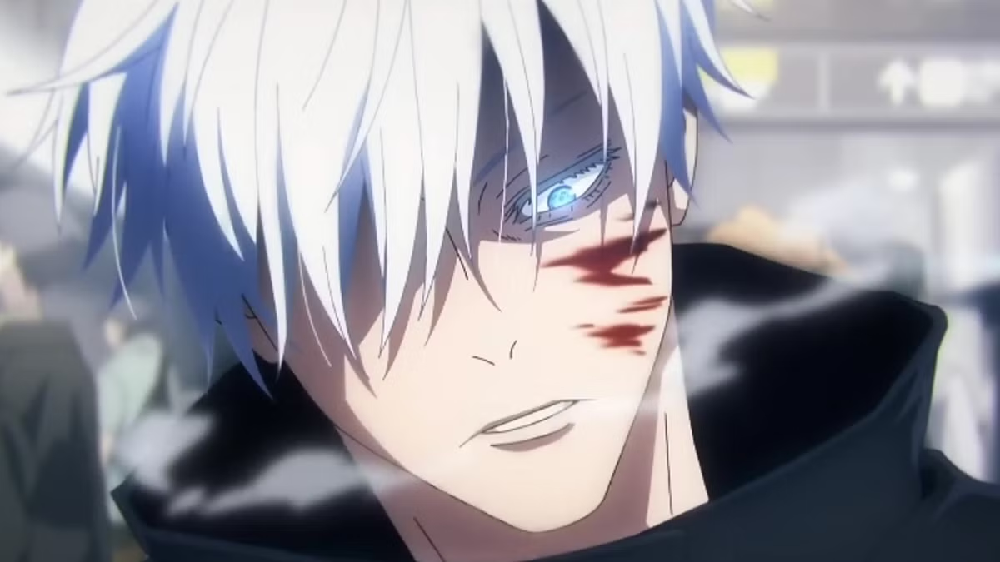

In [59]:
image = PIL.Image.open('gojo.jpg')
display(image)

In [60]:
# Convert the image to an array
X = np.asarray(image)
#Downsample every 4th pixel
X = X[::4,::4,:]
print(X.shape)
shp = X.shape

(169, 300, 3)


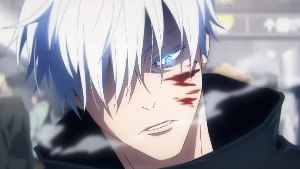

In [61]:
# Display the downscaled image
display(Image.fromarray(X.astype('uint8'), 'RGB'))

In [62]:
# Convert X to a long array of RGB values
X = X.reshape(-1, 3)
print(X.shape)

(50700, 3)


In [63]:
inertia_dict = {}
img_dict = {}

for i in range(0,20):

    inertia = np.zeros(10)
    img_list = []

    for ii in range(0,10):
        print(f'Number of k-means {i+1}, Iteration {ii+1}')
        kmeans = KMeans(n_clusters=i+1).fit(X)
        inertia[ii] = kmeans.inertia_
        segmented_img = kmeans.cluster_centers_[kmeans.labels_]
        img_t = segmented_img.reshape(shp)
        img_x = Image.fromarray(img_t.astype('uint8'), 'RGB')
        img_list.append(img_x)
    
    inertia_dict[f'{i+1}'] = [round(float(inertia.mean()),2),round(float(np.min(inertia)),2),round(float(np.max(inertia)),2)]
    img_dict[f'{i+1}'] = [img_list[np.argmin(inertia)],img_list[np.argmax(inertia)]]

Number of k-means 1, Iteration 1
Number of k-means 1, Iteration 2
Number of k-means 1, Iteration 3
Number of k-means 1, Iteration 4
Number of k-means 1, Iteration 5
Number of k-means 1, Iteration 6
Number of k-means 1, Iteration 7
Number of k-means 1, Iteration 8
Number of k-means 1, Iteration 9
Number of k-means 1, Iteration 10
Number of k-means 2, Iteration 1
Number of k-means 2, Iteration 2
Number of k-means 2, Iteration 3
Number of k-means 2, Iteration 4
Number of k-means 2, Iteration 5
Number of k-means 2, Iteration 6
Number of k-means 2, Iteration 7
Number of k-means 2, Iteration 8
Number of k-means 2, Iteration 9
Number of k-means 2, Iteration 10
Number of k-means 3, Iteration 1
Number of k-means 3, Iteration 2
Number of k-means 3, Iteration 3
Number of k-means 3, Iteration 4
Number of k-means 3, Iteration 5
Number of k-means 3, Iteration 6
Number of k-means 3, Iteration 7
Number of k-means 3, Iteration 8
Number of k-means 3, Iteration 9
Number of k-means 3, Iteration 10
Number 

In [64]:
mean = np.zeros(20)
mini = np.zeros(20)
maxi = np.zeros(20)

for key in inertia_dict.keys():
    ii = int(key) - 1
    mean[ii] = inertia_dict[key][0]
    mini[ii] = inertia_dict[key][1]
    maxi[ii] = inertia_dict[key][2]

In [66]:
inertia_dict

{'1': [952493376.61, 952493376.61, 952493376.61],
 '2': [209467751.52, 209467050.59, 209469080.71],
 '3': [88435500.75, 88432893.45, 88442338.12],
 '4': [47649557.89, 47648388.1, 47650940.6],
 '5': [36056788.48, 35505992.52, 40342545.47],
 '6': [28919170.58, 28869401.8, 28964933.97],
 '7': [23611353.34, 23368652.07, 25756407.12],
 '8': [21220065.32, 20574967.2, 23712255.29],
 '9': [18417407.87, 18194614.92, 18856688.05],
 '10': [16536066.78, 16190494.97, 17610511.35],
 '11': [14577224.07, 14382020.53, 15078159.22],
 '12': [13328565.25, 12909592.39, 14030992.93],
 '13': [11987199.34, 11779145.44, 12245438.62],
 '14': [11155005.89, 10689290.92, 11724933.1],
 '15': [10227203.4, 9941389.19, 11390268.7],
 '16': [9622695.8, 9446960.58, 9800364.58],
 '17': [9055442.65, 8883320.04, 9284288.51],
 '18': [8526099.29, 8375284.42, 8991207.03],
 '19': [8073522.38, 7892478.94, 8351363.43],
 '20': [7651294.37, 7569047.4, 7759386.05]}

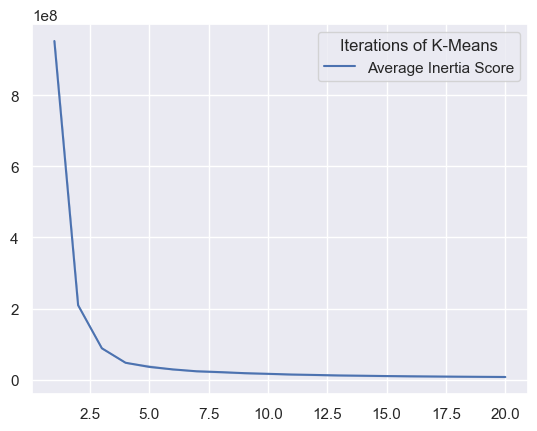

In [65]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set()

x = np.array([int(key) for key in inertia_dict.keys()])

plt.plot(x, mean, 'b-', label='Average Inertia Score')
plt.fill_between(x, mini, maxi, color='b', alpha=0.2)

plt.legend(title='Iterations of K-Means')
plt.show()

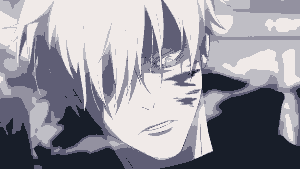

In [67]:
img_dict['5'][0]

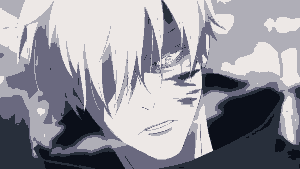

In [69]:
img_dict['5'][1]

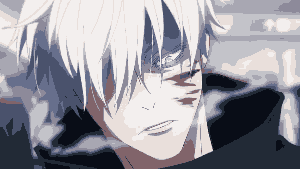

In [70]:
img_dict['10'][0]

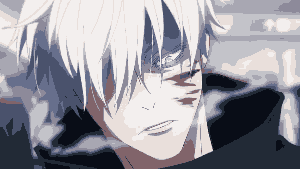

In [71]:
img_dict['10'][0]

After doing the analysis, we see in the plot, that the inertia has a very low variation for most of values of K. But as this image has a very large variations of colors, in contrast to the ladybug iamge, so a large number of k is appropiate to better segment the picture. 

We confirm this by looking at the K=5 and K=10. 